# For colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/MyDrive/ProjectI'

Mounted at /content/drive
/content/drive/MyDrive/ProjectI


In [ ]:
#unzip file archive.zip
import os 
if not os.path.isdir('/content/drive/MyDrive/ProjectI/Data') : 
  !unzip archive.zip

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Data preprocessing
Load and preprocess data, the dataset is 315 Bird Species - Classification dataset on Kaggle

In [ ]:
# import 1 số thư viện cần thiết
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torchvision
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import random
import os
from os import system

In [ ]:
train_dir = os.path.join(os.getcwd(), 'Data', 'train')
test_dir  = os.path.join(os.getcwd(), 'Data', 'test')
val_dir   = os.path.join(os.getcwd(), 'Data', 'valid')

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])
# creart torch.Dataset from dir without transformation
train_ds_raw = torchvision.datasets.ImageFolder(root=train_dir, transform=transforms.ToTensor())
test_ds_raw  = torchvision.datasets.ImageFolder(root=test_dir, transform=transforms.ToTensor())
val_ds_raw   = torchvision.datasets.ImageFolder(root=val_dir, transform=transforms.ToTensor())
# create torch.Dataset from dir with transformation
train_ds = torchvision.datasets.ImageFolder(root=train_dir, transform=transform)
test_ds  = torchvision.datasets.ImageFolder(root=test_dir, transform=transform)
val_ds   = torchvision.datasets.ImageFolder(root=val_dir, transform=transform)


In [ ]:
# check number of classes
CLASSES = list(train_ds.class_to_idx.keys())
print('Classes\'s name : ' + str(CLASSES))
print('Number of classes : ' + str(len(CLASSES)))
# check number of data in each dataset
print('Train len :{}'.format(len(train_ds.targets)))
print('Test len :{}'.format(len(test_ds.targets)))
print('Val len :{}'.format(len(val_ds.targets)))
# check data shape
print(next(iter(train_ds_raw))[0].shape)

Classes's name : ['AFRICAN CROWNED CRANE', 'AFRICAN FIREFINCH', 'ALBATROSS', 'ALEXANDRINE PARAKEET', 'AMERICAN AVOCET', 'AMERICAN BITTERN', 'AMERICAN COOT', 'AMERICAN GOLDFINCH', 'AMERICAN KESTREL', 'AMERICAN PIPIT', 'AMERICAN REDSTART', 'ANHINGA', 'ANNAS HUMMINGBIRD', 'ANTBIRD', 'ARARIPE MANAKIN', 'ASIAN CRESTED IBIS', 'BALD EAGLE', 'BALD IBIS', 'BALI STARLING', 'BALTIMORE ORIOLE', 'BANANAQUIT', 'BANDED BROADBILL', 'BANDED PITA', 'BAR-TAILED GODWIT', 'BARN OWL', 'BARN SWALLOW', 'BARRED PUFFBIRD', 'BAY-BREASTED WARBLER', 'BEARDED BARBET', 'BEARDED BELLBIRD', 'BEARDED REEDLING', 'BELTED KINGFISHER', 'BIRD OF PARADISE', 'BLACK & YELLOW bROADBILL', 'BLACK BAZA', 'BLACK FRANCOLIN', 'BLACK SKIMMER', 'BLACK SWAN', 'BLACK TAIL CRAKE', 'BLACK THROATED BUSHTIT', 'BLACK THROATED WARBLER', 'BLACK VULTURE', 'BLACK-CAPPED CHICKADEE', 'BLACK-NECKED GREBE', 'BLACK-THROATED SPARROW', 'BLACKBURNIAM WARBLER', 'BLONDE CRESTED WOODPECKER', 'BLUE COAU', 'BLUE GROUSE', 'BLUE HERON', 'BLUE THROATED TOUCANET'

Vậy ta đã có 1 bộ dữ liệu phân loại chim 315 lớp với :


*   45980 ảnh trong tập train
*   1575 ảnh trong tập test
*   1575 ảnh trong tập validation









# DataLoader
Make a Dataloader to train and test on batch in order to descrease training time

In [ ]:
# set 1 số tham số
batch_size = 1024
num_workers = 2

In [ ]:
# DataLoader cho dữ liệu chưa normalized
train_loader_raw = DataLoader(train_ds_raw, batch_size=batch_size, num_workers=num_workers, shuffle=True)
test_loader_raw  = DataLoader(test_ds_raw, batch_size=batch_size, num_workers=num_workers, shuffle=True)
val_loader_raw   = DataLoader(val_ds_raw, batch_size=batch_size, num_workers=num_workers, shuffle=True)
# DataLoader cho dữ liệu đã normalized
train_loader = DataLoader(train_ds, batch_size=batch_size, num_workers=num_workers, shuffle=True)
test_loader = DataLoader(test_ds, batch_size=batch_size, num_workers=num_workers, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=batch_size, num_workers=num_workers, shuffle=True)

# Visualize data distribution 
View histogram of each category images number

In [ ]:
# count number of images for each label
labels_count = {}
for label in train_ds.class_to_idx.keys():
    value = train_ds.class_to_idx[label]
    labels_count[label] = train_ds.targets.count(value)
print(labels_count)

{'AFRICAN CROWNED CRANE': 137, 'AFRICAN FIREFINCH': 140, 'ALBATROSS': 133, 'ALEXANDRINE PARAKEET': 165, 'AMERICAN AVOCET': 179, 'AMERICAN BITTERN': 170, 'AMERICAN COOT': 158, 'AMERICAN GOLDFINCH': 133, 'AMERICAN KESTREL': 130, 'AMERICAN PIPIT': 179, 'AMERICAN REDSTART': 139, 'ANHINGA': 147, 'ANNAS HUMMINGBIRD': 139, 'ANTBIRD': 150, 'ARARIPE MANAKIN': 155, 'ASIAN CRESTED IBIS': 157, 'BALD EAGLE': 160, 'BALD IBIS': 147, 'BALI STARLING': 132, 'BALTIMORE ORIOLE': 137, 'BANANAQUIT': 166, 'BANDED BROADBILL': 194, 'BANDED PITA': 166, 'BAR-TAILED GODWIT': 120, 'BARN OWL': 120, 'BARN SWALLOW': 132, 'BARRED PUFFBIRD': 136, 'BAY-BREASTED WARBLER': 143, 'BEARDED BARBET': 160, 'BEARDED BELLBIRD': 142, 'BEARDED REEDLING': 144, 'BELTED KINGFISHER': 125, 'BIRD OF PARADISE': 128, 'BLACK & YELLOW bROADBILL': 142, 'BLACK BAZA': 156, 'BLACK FRANCOLIN': 131, 'BLACK SKIMMER': 120, 'BLACK SWAN': 119, 'BLACK TAIL CRAKE': 149, 'BLACK THROATED BUSHTIT': 122, 'BLACK THROATED WARBLER': 135, 'BLACK VULTURE': 126, 

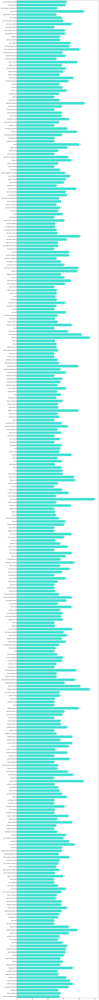

In [ ]:
import matplotlib.pyplot as plt

# Figure size
fig, ax = plt.subplots(figsize=(16, 200))
# Creating horizontial bar plot
ax.barh(list(labels_count.keys()), list(labels_count.values()), color='turquoise')
plt.margins(y=0) # remove margin
# Add annotation to bar
for i in ax.patches:
  plt.text(i.get_width()+0.2, i.get_y()+0.35,
             str(round((i.get_width()), 2)),
             fontsize = 10, fontweight ='bold',
             color ='grey')

plt.show()

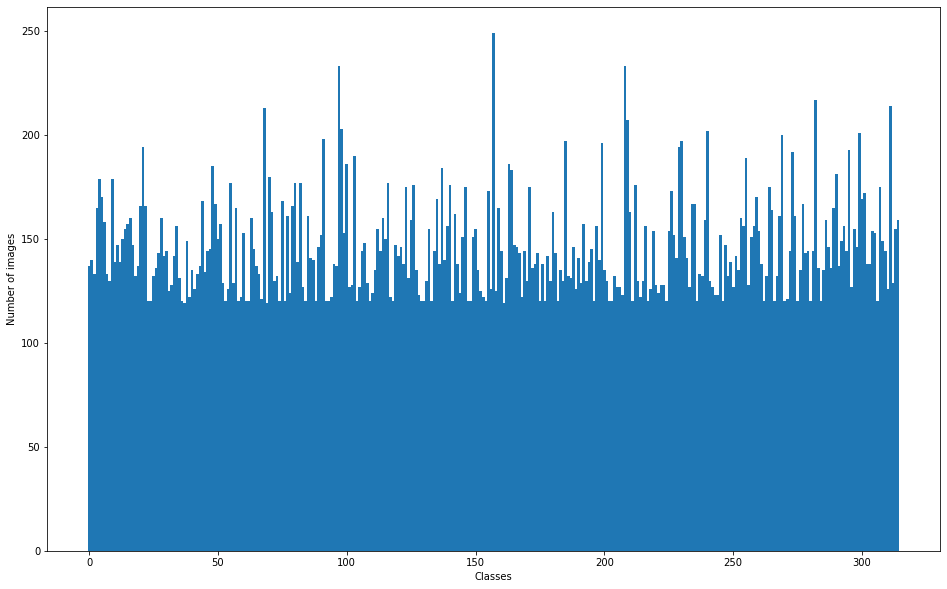

In [ ]:
# Figure size
fig, ax = plt.subplots(figsize=(16, 10))
# Creating horizontial bar plot
ax.bar(np.arange(0,315), list(labels_count.values()), width=1)
ax.set_xlabel("Classes")
ax.set_ylabel("Number of images")
plt.show()

# Data Overview
View some images in the Dataset 

In [ ]:
from torchvision.utils import make_grid
# xem 1 vài ảnh
def show_batch(data_loader):
    for images, labels in data_loader:
        fig, ax = plt.subplots(figsize=(24, 12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=16).permute(1, 2, 0))
        break

def implot(image, label):
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.imshow(image.permute(1, 2, 0))
    plt.title(CLASSES[label])
    plt.axis('off')
    plt.show()

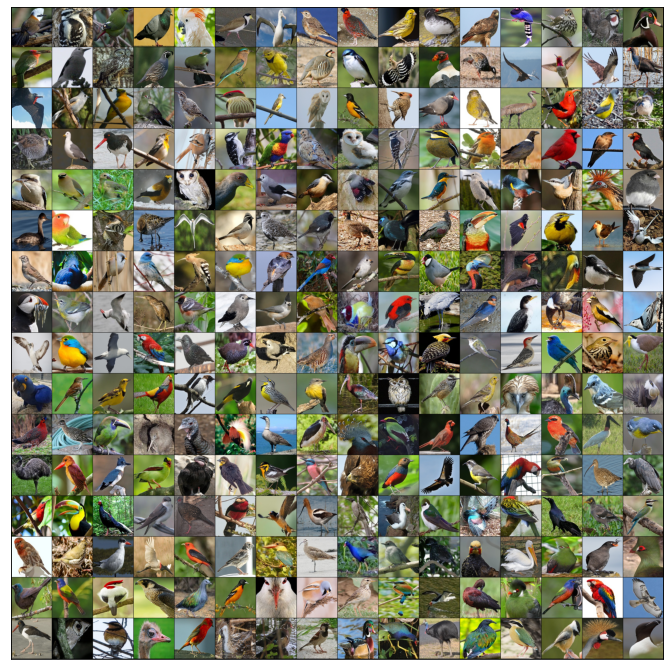

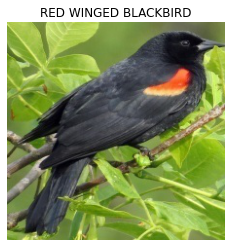

In [ ]:
# xem qua 1 vài ảnh chưa qua normalized
# xem theo batch
show_batch(train_loader_raw)
# xem ảnh và nhãn
images, labels = next(iter(train_loader_raw))
idx = random.choice(range(len(images)))
implot(images[idx], labels[idx])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


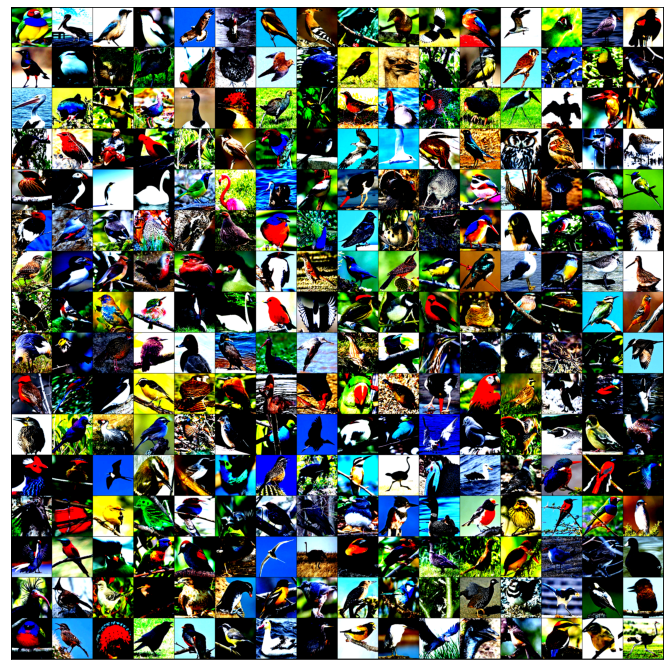

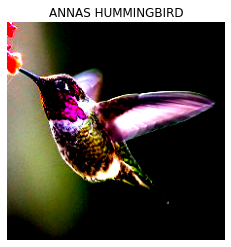

In [ ]:
# xem qua 1 vài ảnh đã qua normalized
# xem theo batch
show_batch(train_loader)
# xem ảnh và nhãn
images, labels= next(iter(train_loader))
idx = random.choice(range(len(images)))
implot(images[idx], labels[idx])

# Trainer 
Definer Trainer and Tester class to train and test all the model. In this way, coding time is reduced

In [ ]:
# import libraries 
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

In [ ]:
# ultilities 
def viewOptimizer(optimizer):
    # viewing the optimizer parameters
    print("Optimizer's state_dict:")
    for var_name in optimizer.state_dict():
        print(var_name, "\t", optimizer.state_dict()[var_name])
        
def viewModel(model):
    # viewing the model parameters
    print("Model's state dict:")
    for var_name in model.state_dict():
        print(var_name, "\t", model.state_dict()[var_name])

In [ ]:
import json
import datetime
from IPython.display import clear_output
from time import time
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
# assign path to specific action
save_path = os.path.join(os.getcwd(), 'Model')
summary_path = os.path.join(os.getcwd(), 'Summary')
cm_path = os.path.join(os.getcwd(), 'Confusion Matrix')

class Trainer():
    ''' A generic Trainer forn trainning a neural network.
        Args:
            model (nn.Module) : a neural network model
            train_loader (torch.DataLoader) : torch DataLoader for training dataset 
            val_loader (torch.DataLoader) : torch DataLoader for validating dataset
            model_name (string) : name of the model
            device (string) : name of system device. 'cpu' or 'cuda'
            optimizer_function (torch.optim) : class of torch optimizer 
            criterion (optional) : loss function used, default : CrossEntropyLoss
            epochs (int, optional) : number of epochs to train, default : 10
            learning_rate (float, optional) : learning rate, default : 1e-4
            display_step (int, callable, optional) : A number to display result in training process

        Attributes:
            model_path (string) : path to store model
            writer : writer to store result in tensorboard
    '''
    def __init__(self, model, train_loader, val_loader, model_name, device, 
                 optimizer_function,
                 criterion=nn.CrossEntropyLoss(), 
                 epochs=10, learning_rate=1e-4, display_step=100):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.model_name = model_name
        self.device = device
        self.optimizer_function = optimizer_function
        self.criterion = criterion
        self.epochs = epochs
        self.learning_rate = learning_rate
        self.display_step = display_step
        
        self.model_path = os.path.join(save_path, f'{self.model_name}.pt') 
        
        # get trained epochs
        self.trained_epochs = 0
        with open(os.path.join(summary_path, 'info.json'), 'r') as file:
            self.info = json.load(file)
        # load model
        self.load()
            
        # optimizer
        self.optimizer = self.optimizer_function(self.model.parameters(), self.learning_rate)

        # SummaryWriter for tensorboard
        self.writer = SummaryWriter(os.path.join(summary_path, self.model_name))

        # move model to device
        self.model.to(self.device)
        
        # update infomation
        with open(os.path.join(summary_path, 'info.json'), 'w') as file:
            json.dump(self.info, file)

    def train(self, show_batches_result=False):
        ''' Training and validating the model, train the model by number of epochs and
            validate after each epoch 
            Args :
                show_batches_result (bool) : Show the result in batch after train display_step batches        
            Returns :
                nn.Module : trained model
        '''
        # start training
        start_traning_time = time()
        print('******* START TRAINING *******')
        
        # validation loss min to compare
        val_loss_min = self.info[self.model_name]['best val loss']
        
        optimizer = self.optimizer
        # scheduler for adjusting the learning_rate
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            patience=2,
            verbose=True
        )
        for epoch in range(self.trained_epochs + 1, self.trained_epochs + self.epochs + 1):
            result = {}

            ##################
            # TRAINING PHASE #
            ##################

            # start epoch clock
            start_epoch = time()
            self.model.train()
            train_losses = []
            for batch_idx, (data, target) in enumerate(self.train_loader):
                # move to device
                data, target = data.to(self.device), target.to(self.device)
                # find the loss and update the model parameters accordingly
                optimizer.zero_grad()
                # forward pass : get predicted result by passing input to the model
                output = self.model(data)
                # calculate batch_loss
                loss = self.criterion(output, target)
                # backward pass : compute gradient of the loss
                loss.backward()
                # parameter update
                optimizer.step()
                # store loss
                train_losses.append(loss)
                
                # print training process results
                if show_batches_result:
                    if batch_idx % self.display_step == 0:
                        #clear_output()
                        #viewOptimizer(optimizer)
                        #viewModel(self.model)
                        print('Train Epoch: {} [{:6d}/{} ({:.0f}%)]\t\tTrain Loss: {:.6f}'
                              .format(epoch, batch_idx * len(data), 
                                      len(train_loader.dataset),
                                      100. * batch_idx / len(train_loader), 
                                      loss.item()))
                        print(output)
                        print(target)

                # move data back to cpu 
                data, target = data.cpu(), target.cpu()
            # calculate average loss of training phase
            train_loss = torch.stack(train_losses).mean().item()

            ####################
            # VALIDATION PHASE #
            ####################
            
            with torch.no_grad():
                self.model.eval()
                # init variables to store losses and accuracy in batches
                batch_losses = [] 
                batch_accs = []
                for (data, target) in self.val_loader:
                    # move to device
                    data, target = data.to(self.device), target.to(self.device)
                    # forward pass : get predicted result by passing input to the model
                    output = self.model(data)
                    # get final prediction by taking the maximum output value
                    _, prediction = torch.max(output, dim=1)
                    # calculate loss and accuracy
                    loss = self.criterion(output, target)
                    accuracy = torch.tensor(torch.sum(prediction == target).item() 
                                            / len(prediction))
                    # store them in list 
                    batch_losses.append(loss)
                    batch_accs.append(accuracy)
                # calculate average loss and accuracy in validation phase
                val_loss = torch.stack(batch_losses).mean().item()
                val_acc  = torch.stack(batch_accs).mean().item()

            ###################
            # POST EPOCH PLAN #
            ###################

            # store the results
            result['train_loss'] = train_loss
            result['val_loss']   = val_loss
            result['val_acc']    = val_acc
            # print training and validating results in one epoch
            print("Epoch {} --- Training loss: {:.4f}   Validation loss: {:.4f}   Validation accuracy: {:.4f} ({} / {})"
                  .format(epoch, 
                          result['train_loss'], 
                          result['val_loss'], 
                          result['val_acc'],
                          int(result['val_acc'] * len(self.val_loader.dataset)),
                          len(self.val_loader.dataset)))
            print('Time executed : {:.1f} s'.format(time() - start_epoch))
            
            # add training loss, validation loss, validation accuracy in 1 epoch to writer
            for batch_idx, loss in enumerate(train_losses):
                self.addScalar('Training loss in process', loss, epoch * self.train_loader.batch_size * batch_idx)
            self.addScalar('Training loss', result['train_loss'], epoch)
            self.addScalar('Validation loss', result['val_loss'], epoch)
            self.addScalar('Validation accuracy', result['val_acc'], epoch)
            # update infomation
            self.info[self.model_name]['trained epochs'] += 1
            self.info[self.model_name]['last trained date'] = str(datetime.datetime.now())
            self.info[self.model_name]['best val loss'] = min(self.info[self.model_name]['best val loss'], result['val_loss'])
            self.info[self.model_name]['best val accuracy'] = max(self.info[self.model_name]['best val accuracy'], result['val_acc'])
            with open(os.path.join(summary_path, 'info.json'), 'w') as file:
                json.dump(self.info, file)
            # save the model if validation loss has decreased
            if val_loss <= val_loss_min:
                print('Validation loss decreased ({:.6f} --> {:.6f}). '
                      .format(val_loss_min,
                              result['val_loss']))
                self.save()
                val_loss_min = result['val_loss']

            ########################
            # ADJUSTING PARAMETERS #
            ########################

            # adjust learning_rate based on validation result
            scheduler.step(result['val_loss'])

        print('Total training time: {:.1f} s'.format(time() - start_traning_time))
            
        return self.model
    
    def save(self):
        # save the model
        print('Saving model ... ', end='')
        torch.save(self.model.state_dict(), self.model_path)
        print('Completed')

    def load(self):
        # load the model
        if os.path.exists(self.model_path):
            print('Loading model ... ', end ='')
            self.model.load_state_dict(torch.load(self.model_path, map_location=torch.device(self.device)))
            self.trained_epochs += self.info[self.model_name]['trained epochs']
            print('Completed')
            self.get_info()
        else :
            self.info[self.model_name] = {'trained epochs' : 0,
                                          'last trained date' : str(datetime.datetime.now()),
                                          'best val loss' : 999,
                                          'best val accuracy' : 0}
            
    def get_info(self):
        # get info of the model
        print(f'Model name :  {self.model_name}')
        for key in self.info[self.model_name].keys() :
            print(f'{key} : ',end ='')
            print(self.info[self.model_name][key])
                
    def addScalar(self, tag, scalar_value, global_step=None, walltime=None, new_style=True, double_precision=False):
        # store result 
        self.writer.add_scalar(tag, scalar_value, global_step, walltime, new_style, double_precision)

class Tester():
    def __init__(self, model, test_loader, model_name, device,
                 criterion=nn.CrossEntropyLoss()):
        ''' A generic Tester a neural network.
        Args:
            model (nn.Module) : a neural network model
            test_loader (torch.DataLoader) : torch DataLoader for tesing dataset 
            model_name (string) : name of the model
            device (string) : name of system device. 'cpu' or 'cuda'
            criterion (optional) : loss function used, default : CrossEntropyLoss

        Attributes:
            model_path (string) : path to store model
        '''
        self.model = model
        self.test_loader = test_loader
        self.model_name = model_name
        self.device = device
        self.criterion = criterion
        # set model path
        self.model_path = os.path.join(save_path, f'{self.model_name}.pt') 
        # load model
        self.load()
        # move model to device
        self.model.to(device)

    def test(self):
        ''' Testing the model
            Args :
            Returns :
        '''
        with torch.no_grad():
            self.model.eval()
            # init variables to store losses and accuracy in batches
            batch_losses = [] 
            batch_accs = []
            correct = 0
            for (data, target) in self.test_loader:
                # move to device
                data, target = data.to(self.device), target.to(self.device)
                # forward pass : get predicted result by passing input to the model
                output = self.model(data)
                # calculate loss
                loss = self.criterion(output, target)
                # calculate accuracy
                _, prediction = torch.max(output, dim=1)
                correct += torch.tensor(torch.sum(prediction == target).item())
                accuracy = torch.tensor(torch.sum(prediction == target).item() 
                                        / len(prediction))
                # store them in list 
                batch_losses.append(loss)
                batch_accs.append(accuracy)
            # calculate average loss and accuracy in validation phase
            test_loss = torch.stack(batch_losses).mean().item()
            test_acc  = torch.stack(batch_accs).mean().item()
            # print result
            print('******* TESTING RESULT *******')
            print('Test loss: {:.6f}'.format(test_loss))
            print('Test accuracy: {:.6f} ({} / {})'.format(test_acc, correct, len(self.test_loader.dataset)))

    def get_classification_report(self, matrix=False):
        ''' Get classification report of test
            Args :
                matrix (bool) : show Confusion matrix
            Returns :
        '''
        with torch.no_grad():
            self.model.eval()
            # init variables to store losses and accuracy in batches
            targets = torch.Tensor()
            predictions = torch.Tensor()
            for (data, target) in self.test_loader:
                # move to device
                data, target = data.to(self.device), target.to(self.device)
                # forward pass : get predicted result by passing input to the model
                output = self.model(data)
                # calculate accuracy
                _, prediction = torch.max(output, dim=1)
                predictions = torch.concat((predictions.to('cpu'), prediction.to('cpu')))
                targets = torch.concat((targets.to('cpu'), target.to('cpu')))
        # print result
        print('******* CLASSIFICATION REPORT *******')
        print(classification_report(targets.view(-1), predictions.view(-1), target_names=CLASSES))
        # confusion matrix
        if matrix:
            cm = confusion_matrix(targets.view(-1), predictions.view(-1))
            disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                          display_labels=CLASSES)

            # NOTE: Fill all variables here with default values of the plot_confusion_matrix
            plt.style.use('default')
            fig, ax = plt.subplots(figsize=(200, 200))
            disp = disp.plot(xticks_rotation='vertical', ax=ax, cmap='inferno')
            # save the confusion matrix image
            print('Saving confusion matrix ... ', end='')
            cm_file = os.path.join(cm_path, f'{self.model_name}.png')
            plt.savefig(cm_file)
            print(f'Completed\nYour pictur have been saved as {cm_file}')
            plt.close()

        
    def load(self):
        if os.path.exists(self.model_path):
            print('Loading model ... ', end = '')
            self.model.load_state_dict(torch.load(self.model_path, map_location=torch.device(self.device)))
            print('Completed')

# MODELS

# Scratch Model
My Scratch Model has build based on the architechture of AlexNet - an famous CNN architecture.

The architecture of model is described through this figure.
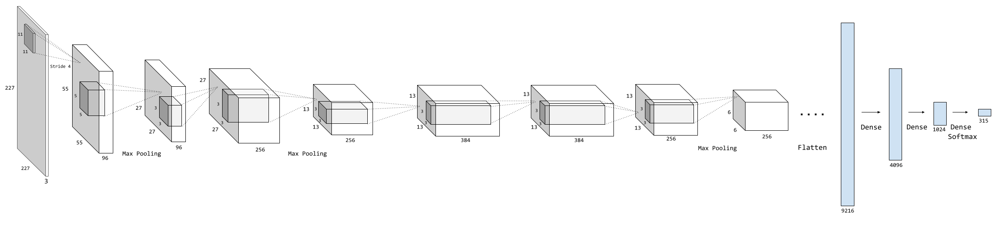

In [ ]:
class AlexNet_Scratch(nn.Module):
    ''' Scratch model based on architecture of AlexNet
        This class inherits the torch.nn.Module

        Attributes:
            conv1, conv2, conv3, conv 4, conv 5 : Convolutional layers
            relu : Relu function
            softmax : Softmax function
            bn0 , bn1, bn2, bn3, bn4, bn5 : Batch Normalization layers
            maxpool : Max pooling layer
            dropout : Dropout layer
            fc1, fc2, fc3 : Fully Connected layers 
    '''
    def __init__(self):       
        super(AlexNet_Scratch, self).__init__()
        # convolutional layer (input shape : 3 x 227 x 227)
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=96, kernel_size=11, stride=4) 
        # convolutional layer (input shape : 96 x 27 x 27)
        self.conv2 = nn.Conv2d(96, 256, 5, padding=2)
        # convolutional layer (input shape : 256 x 27 x 27)
        self.conv3 = nn.Conv2d(256, 384, 3, padding=1)
        # convolutional layer (input shape : 384 x 13 x 13)
        self.conv4 = nn.Conv2d(384, 384, 3, padding=1)
        # convolutional layer (input shape : 384 x 13 x 13)
        self.conv5 = nn.Conv2d(384, 256, 3, padding=1)

        # relu 
        self.relu = nn.ReLU()
        # normalization
        self.bn0 = nn.BatchNorm2d(3)
        self.bn1 = nn.BatchNorm2d(96)
        self.bn2 = nn.BatchNorm2d(256)
        self.bn3 = nn.BatchNorm2d(384)
        self.bn4 = nn.BatchNorm2d(384)
        self.bn5 = nn.BatchNorm2d(256)
        # self.norm = nn.LocalResponseNorm(size=5, alpha=0.0001, beta=0.75, k=2)
        # max pooling layer (kernel size = 3 x 3)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2)

        # dropout layer
        self.dropout = nn.Dropout(0.5)
        # fully connected layers
        self.fc1 = nn.Linear(in_features=(256 * 6 * 6), out_features=4096)
        self.fc2 = nn.Linear(in_features=4096, out_features=1024)
        self.fc3 = nn.Linear(in_features=1024, out_features=len(CLASSES))
        self.softmax = nn.LogSoftmax(dim=1) # with softmax


    def forward(self, x):
        # reshape image shape to 3 x 227 x 227
        x = transforms.CenterCrop(227)(x)  # out 3 x 277 x 277
        # x = self.bn0(x)
        # conv 1
        x = self.conv1(x)               # out 96 x 55 x 55
        x = self.relu(x)
        x = self.maxpool(x)             # out 96 x 27 x 27
        # x = self.norm(x)
        x = self.bn1(x)
        # conv 2
        x = self.conv2(x)               # out 256 x 27 x 27
        x = self.relu(x)
        x = self.maxpool(x)             # out 256 x 13 x 13
        # x = self.norm(x)
        x = self.bn2(x)
        # conv 3
        x = self.conv3(x)               # out 384 x 13 x 13
        x = self.relu(x)
        x = self.bn3(x)
        # conv 4
        x = self.conv4(x)               # out 384 x 13 x 13
        x = self.relu(x)
        x = self.bn4(x)
        # conv 5
        x = self.conv5(x)               # out 256 x 13 x 13
        x = self.relu(x)
        x = self.maxpool(x)             # out 256 x 6 x 6
        x = self.bn5(x)
        # reduce dimentions for linear layer input
        x = x.view(-1, 256 * 6 * 6)
        # fully connected
        x = self.dropout(x)
        x = self.fc1(x)                 # out 4096
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)                 # out 1024
        x = self.relu(x)
        x = self.fc3(x)                 # out 315
        x = self.softmax(x)  

        return x

In [ ]:
from torchvision import models
from torchsummary import summary

model = AlexNet_Scratch()
summary(model, (3, 224, 224))

## Scratch model training

In [ ]:
# init the model
AlexNet_Scratch_model = AlexNet_Scratch()
model_name = 'AlexNet_Scratch'
print(AlexNet_Scratch_model)

AlexNet_Scratch(
  (conv1): Conv2d(3, 96, kernel_size=(11, 11), stride=(4, 4))
  (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU()
  (bn0): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padd

In [ ]:
# init some hyper parameters
device = 'cuda' if torch.cuda.is_available() else 'cpu'
learning_rate = 1e-5
epochs = 5
display_step = 3
criterion=nn.CrossEntropyLoss()
optimizer_function = optim.Adam

print('Device: ' + device)

Device: cuda


In [ ]:
# train
trainer = Trainer(AlexNet_Scratch_model, train_loader, val_loader, model_name, device, 
                  optimizer_function, criterion,
                  epochs, learning_rate, display_step)
trainer.train()

In [ ]:
# test
tester = Tester(AlexNet_Scratch_model, test_loader, model_name, device, criterion)
tester.test()
tester.get_classification_report(matrix=True)

Loading model ... Completed
******* TESTING RESULT *******
Test loss: 0.789570
Test accuracy: 0.822888 (1291 / 1575)
******* CLASSIFICATION REPORT *******
                             precision    recall  f1-score   support

      AFRICAN CROWNED CRANE       0.67      0.80      0.73         5
          AFRICAN FIREFINCH       1.00      0.80      0.89         5
                  ALBATROSS       1.00      0.40      0.57         5
       ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
            AMERICAN AVOCET       0.80      0.80      0.80         5
           AMERICAN BITTERN       0.80      0.80      0.80         5
              AMERICAN COOT       0.83      1.00      0.91         5
         AMERICAN GOLDFINCH       0.83      1.00      0.91         5
           AMERICAN KESTREL       0.75      0.60      0.67         5
             AMERICAN PIPIT       0.80      0.80      0.80         5
          AMERICAN REDSTART       1.00      0.60      0.75         5
                

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Saving confusion matrix ... Completed
Your pictur have been saved as /content/drive/My Drive/ProjectI/Confusion Matrix/AlexNet_Scratch.png


# Transfer Learning
I use ResNet18 and DenseNet121 as my model backbone and change the last fully connected layer for classification task

In [ ]:
import torchvision.models as models

In [ ]:
# init some hyper params
device = 'cuda' if torch.cuda.is_available() else 'cpu'
learning_rate = 1e-3
epochs = 6
display_step = 1
criterion=nn.CrossEntropyLoss()
optimizer_function = optim.Adam

print('Device: ' + device)

Device: cpu


## FineTuning
Only trained the last fully connected layer

### ResNet18

In [ ]:
class ResNet_18_TL(nn.Module):
    ''' Model ResNet18 but change last fc layer'''
    def __init__(self, num_classes):
        super(ResNet_18_TL, self).__init__()
        self.network = models.resnet18(pretrained=True)
        number_of_features = self.network.fc.in_features
        self.network.fc = nn.Linear(number_of_features, num_classes)
        
    def forward(self, x):
        return self.network(x)
    
    def freeze(self):
        for param in self.network.parameters():
            param.requires_grad= False
        for param in self.network.fc.parameters():
            param.requires_grad= True
        
    def unfreeze(self):
        for param in self.network.parameters():
            param.requires_grad= True

ResNet_18_TL_model = ResNet_18_TL(len(CLASSES))
ResNet_18_TL_model

In [ ]:
model_name = 'ResNet_18_TL'
# freeze convolutional layers
ResNet_18_TL_model.freeze()
# training
trainer = Trainer(ResNet_18_TL_model, train_loader, val_loader, model_name, device, 
                  optimizer_function, criterion,
                  epochs, learning_rate, display_step)
trainer.train()
# unfreeze
ResNet_18_TL_model.unfreeze()

Loading model ... Completed
Model name :  ResNet_18_TL
trained epochs : 5
last trained date : 2022-01-02 10:17:54.668266
best val loss : 0.37614116072654724
best val accuracy : 0.9427459239959717
******* START TRAINING *******
Epoch 6 --- Training loss: 0.4951   Validation loss: 0.3189   Validation accuracy: 0.9447 (1487 / 1575)
Time executed : 250.7 s
Validation loss decreased (0.376141 --> 0.318915). 
Saving model ... Completed
Epoch 7 --- Training loss: 0.3996   Validation loss: 0.2672   Validation accuracy: 0.9521 (1499 / 1575)
Time executed : 247.4 s
Validation loss decreased (0.318915 --> 0.267151). 
Saving model ... Completed
Epoch 8 --- Training loss: 0.3426   Validation loss: 0.2485   Validation accuracy: 0.9402 (1480 / 1575)
Time executed : 246.1 s
Validation loss decreased (0.267151 --> 0.248528). 
Saving model ... Completed
Epoch 9 --- Training loss: 0.2998   Validation loss: 0.2156   Validation accuracy: 0.9516 (1498 / 1575)
Time executed : 247.8 s
Validation loss decrease

In [ ]:
model_name = 'ResNet_18_TL'
tester = Tester(ResNet_18_TL_model, test_loader, model_name, device, criterion)
tester.test()
tester.get_classification_report(matrix=True)

Loading model ... Completed
******* TESTING RESULT *******
Test loss: 0.223549
Test accuracy: 0.959507 (1508 / 1575)
******* CLASSIFICATION REPORT *******
                             precision    recall  f1-score   support

      AFRICAN CROWNED CRANE       1.00      1.00      1.00         5
          AFRICAN FIREFINCH       0.83      1.00      0.91         5
                  ALBATROSS       0.83      1.00      0.91         5
       ALEXANDRINE PARAKEET       1.00      0.80      0.89         5
            AMERICAN AVOCET       1.00      1.00      1.00         5
           AMERICAN BITTERN       1.00      1.00      1.00         5
              AMERICAN COOT       1.00      1.00      1.00         5
         AMERICAN GOLDFINCH       1.00      1.00      1.00         5
           AMERICAN KESTREL       0.83      1.00      0.91         5
             AMERICAN PIPIT       1.00      0.80      0.89         5
          AMERICAN REDSTART       1.00      0.80      0.89         5
                

### Densenet-121

In [ ]:
class DenseNet_121_TL(nn.Module):
    def __init__(self, num_classes):
        super(DenseNet_121_TL, self).__init__()
        self.network = models.densenet121(pretrained=True)
        number_of_features = self.network.classifier.in_features
        self.network.classifier = nn.Linear(number_of_features, num_classes)
        
    def forward(self, x):
        return self.network(x)
    
    def freeze(self):
        for param in self.network.parameters():
            param.requires_grad= False
        for param in self.network.classifier.parameters():
            param.requires_grad= True
        
    def unfreeze(self):
        for param in self.network.parameters():
            param.requires_grad= True

DenseNet_121_TL_model = DenseNet_121_TL(len(CLASSES))
DenseNet_121_TL_model

DenseNet_121_TL(
  (network): DenseNet(
    (features): Sequential(
      (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace=True)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (denselayer2): _DenseLayer(
          (norm1): BatchNorm2d(96, eps=1e-05, mome

In [ ]:
model_name = 'DenseNet_121_TL'
# freeze convolutional layers
DenseNet_121_TL_model.freeze()
# training
trainer = Trainer(DenseNet_121_TL_model, train_loader, val_loader, model_name, device, 
                  optimizer_function, criterion,
                  epochs, learning_rate, display_step)
trainer.train()
# unfreeze
DenseNet_121_TL_model.unfreeze()

Loading model ... Completed
Model name :  DenseNet_121_TL
trained epochs : 5
last trained date : 2022-01-02 12:52:28.041516
best val loss : 0.2862555682659149
best val accuracy : 0.97216796875
******* START TRAINING *******
Epoch 6 --- Training loss: 0.3372   Validation loss: 0.2328   Validation accuracy: 0.9682 (1524 / 1575)
Time executed : 353.1 s
Validation loss decreased (0.286256 --> 0.232802). 
Saving model ... Completed
Epoch 7 --- Training loss: 0.2541   Validation loss: 0.1681   Validation accuracy: 0.9766 (1538 / 1575)
Time executed : 351.9 s
Validation loss decreased (0.232802 --> 0.168111). 
Saving model ... Completed
Epoch 8 --- Training loss: 0.2068   Validation loss: 0.1877   Validation accuracy: 0.9564 (1506 / 1575)
Time executed : 352.3 s
Epoch 9 --- Training loss: 0.1729   Validation loss: 0.1725   Validation accuracy: 0.9726 (1531 / 1575)
Time executed : 351.7 s
Epoch 10 --- Training loss: 0.1470   Validation loss: 0.1573   Validation accuracy: 0.9583 (1509 / 1575)
T

In [ ]:
model_name = 'DenseNet_121_TL'
tester = Tester(DenseNet_121_TL_model, test_loader, model_name, device, criterion)
tester.test()
tester.get_classification_report(matrix=True)

Loading model ... Completed
******* TESTING RESULT *******
Test loss: 0.132656
Test accuracy: 0.976491 (1544 / 1575)
******* CLASSIFICATION REPORT *******
                             precision    recall  f1-score   support

      AFRICAN CROWNED CRANE       1.00      1.00      1.00         5
          AFRICAN FIREFINCH       1.00      1.00      1.00         5
                  ALBATROSS       1.00      1.00      1.00         5
       ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
            AMERICAN AVOCET       1.00      1.00      1.00         5
           AMERICAN BITTERN       1.00      1.00      1.00         5
              AMERICAN COOT       1.00      1.00      1.00         5
         AMERICAN GOLDFINCH       1.00      1.00      1.00         5
           AMERICAN KESTREL       1.00      1.00      1.00         5
             AMERICAN PIPIT       1.00      1.00      1.00         5
          AMERICAN REDSTART       1.00      1.00      1.00         5
                

## Not finetunning
Retrained all the network

In [ ]:
model_name = 'ResNet_18_TL_Full'
# training
trainer = Trainer(ResNet_18_TL_model, train_loader, val_loader, model_name, device, 
                  optimizer_function, criterion,
                  epochs, learning_rate, display_step)
trainer.train()

Loading model ... Completed
Model name :  ResNet_18_TL_Full
trained epochs : 4
last trained date : 2022-01-03 06:34:20.495638
best val loss : 0.16606870293617249
best val accuracy : 0.9550423622131348
******* START TRAINING *******
Epoch 5 --- Training loss: 0.1660   Validation loss: 0.2900   Validation accuracy: 0.9224 (1452 / 1575)
Time executed : 3553.0 s
Epoch 6 --- Training loss: 0.0897   Validation loss: 0.2088   Validation accuracy: 0.9366 (1475 / 1575)
Time executed : 298.6 s
Epoch 7 --- Training loss: 0.0658   Validation loss: 0.3661   Validation accuracy: 0.9087 (1431 / 1575)
Time executed : 299.8 s
Epoch 8 --- Training loss: 0.0550   Validation loss: 0.2261   Validation accuracy: 0.9372 (1476 / 1575)
Time executed : 300.5 s
Epoch 9 --- Training loss: 0.0484   Validation loss: 0.3185   Validation accuracy: 0.9111 (1434 / 1575)
Time executed : 298.0 s
Epoch     5: reducing learning rate of group 0 to 1.0000e-04.
Epoch 10 --- Training loss: 0.0116   Validation loss: 0.0714   Va

ResNet_18_TL(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, trac

In [ ]:
model_name = 'ResNet_18_TL_Full'
tester = Tester(ResNet_18_TL_model, test_loader, model_name, device, criterion)
tester.test()
tester.get_classification_report(matrix=True)

Loading model ... Completed
******* TESTING RESULT *******
Test loss: 0.057259
Test accuracy: 0.981585 (1542 / 1575)
******* CLASSIFICATION REPORT *******
                             precision    recall  f1-score   support

      AFRICAN CROWNED CRANE       1.00      1.00      1.00         5
          AFRICAN FIREFINCH       0.83      1.00      0.91         5
                  ALBATROSS       0.83      1.00      0.91         5
       ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
            AMERICAN AVOCET       1.00      1.00      1.00         5
           AMERICAN BITTERN       1.00      1.00      1.00         5
              AMERICAN COOT       0.83      1.00      0.91         5
         AMERICAN GOLDFINCH       1.00      1.00      1.00         5
           AMERICAN KESTREL       1.00      1.00      1.00         5
             AMERICAN PIPIT       1.00      1.00      1.00         5
          AMERICAN REDSTART       1.00      0.80      0.89         5
                

# Image Retrievial
An image retrieval system is a computer system used for browsing, searching and retrieving images from a large database of digital images. The procedure is shown in the picture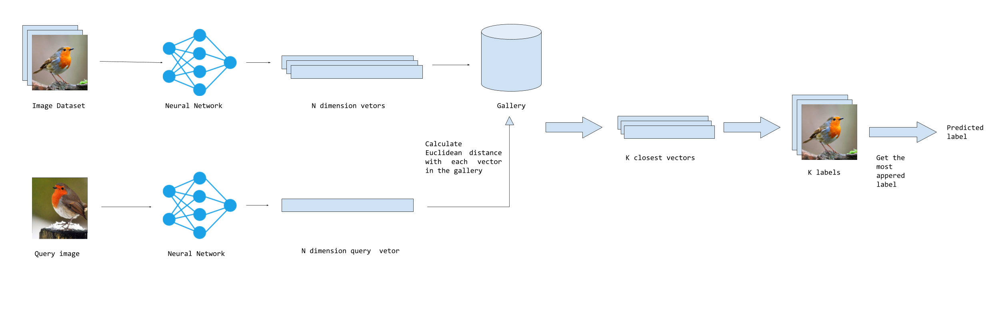

## Create vector gallery

In [ ]:
class ResNet_18_TL(nn.Module):
    ''' Model ResNet18 but change last fc layer'''
    def __init__(self, num_classes):
        super(ResNet_18_TL, self).__init__()
        self.network = models.resnet18(pretrained=True)
        number_of_features = self.network.fc.in_features
        self.network.fc = nn.Linear(number_of_features, num_classes)
        
    def forward(self, x):
        return self.network(x)
    
    def freeze(self):
        for param in self.network.parameters():
            param.requires_grad= False
        for param in self.network.fc.parameters():
            param.requires_grad= True
        
    def unfreeze(self):
        for param in self.network.parameters():
            param.requires_grad= True

In [ ]:
__model_name__ = ['AlexNet_Scratch', 'ResNet_18_TL', 'ResNet_18_TL_Full']
class VectorizationNet(nn.Module):
    ''' Model use to change image into vector
        Args:
            backbone (string) : Name of backbone network, must be 'AlexNet_Scratch', 'ResNet_18_TL', 'ResNet_18_TL_Full'
    '''
    def __init__(self, backbone):
        super(VectorizationNet, self).__init__()
        self.backbone = backbone
        # copy modules from pretrained model
        if self.backbone == 'AlexNet_Scratch':
            self.model = AlexNet_Scratch()
        elif self.backbone == 'ResNet_18_TL' or self.backbone == 'ResNet_18_TL_Full':
            self.model = ResNet_18_TL(len(CLASSES))
        else:
            raise RuntimeError('unknown backbone')

    def num_flat_features(self, x):
        size = x.size()[1:]     # all dimensions except the batch dimension
        num_feature = 1
        for s in size:
            num_feature *= s

        return num_feature
    
    def forward(self, x):
        if self.backbone == 'AlexNet_Scratch':
            x = transforms.CenterCrop(227)(x)  
            x = self.model.conv1(x)            
            x = self.model.relu(x)
            x = self.model.maxpool(x)       
            x = self.model.bn1(x)
            x = self.model.conv2(x)               
            x = self.model.relu(x)
            x = self.model.maxpool(x)             
            x = self.model.bn2(x)
            x = self.model.conv3(x)               
            x = self.model.relu(x)
            x = self.model.bn3(x)
            x = self.model.conv4(x)               
            x = self.model.relu(x)
            x = self.model.bn4(x)
            x = self.model.conv5(x)               
            x = self.model.relu(x)
            x = self.model.maxpool(x)             
            x = self.model.bn5(x)
            # reduce dimensions to a 1024 vector
            x = x.view(-1, self.num_flat_features(x))
            x = self.model.dropout(x)
            x = self.model.fc1(x)                 # out 4096
            x = self.model.relu(x)
            x = self.model.dropout(x)
            x = self.model.fc2(x)                 # out 1024
            x = self.model.relu(x)
            return x
        elif self.backbone == 'ResNet_18_TL' or self.backbone == 'ResNet_18_TL_Full':
            x = self.model.network.conv1(x)
            x = self.model.network.bn1(x)
            x = self.model.network.relu(x)
            x = self.model.network.maxpool(x)
            x = self.model.network.layer1(x)
            x = self.model.network.layer2(x)
            x = self.model.network.layer3(x)
            x = self.model.network.layer4(x)
            x = self.model.network.avgpool(x)
            x = x.view(-1, self.num_flat_features(x)) # out 512
            return x

In [ ]:
from PIL import Image

def get_img(path: str):
    # load an image in path
    with open(path, 'rb') as f:
        img = Image.open(f)
        return img.convert('RGB')

class ImageDataset(Dataset):
    ''' Dataset of image, limit each label images to a size
        This class inherits the torch.Dataset class
        Args :
            root (string) : path of root folder
            ds_type (type of Dataset) : must be 'gallery' or 'query'. If 'gallery', limit the size of dataset
            size (int) : size of limitation
            transform (callable, optional) : transform funtion applied to the dataste 
    '''
    def __init__(self, root, ds_type, size=50, transform=None):
        super(ImageDataset, self).__init__()
        self.root = root
        self.ds_type = ds_type
        self.size = size
        self.img_paths, self.labels = self.create_dataset()
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        label    = self.labels[idx]
        img_path = self.img_paths[idx]
        image    = self.transform(get_img(self.img_paths[idx]))
        sample   = {'image' : image, 'img_path' : img_path, 'label' : label}
        return sample

    def create_dataset(self):
        img_paths = []
        labels    = []
        # the gallery dataset only contains up to 100 images each label
        if self.ds_type == 'gallery':
            size = self.size
        elif self.ds_type == 'query':
            size = 99999
        else:
            raise RuntimeError('Dataset type not subscriptable')

        for root_folder, _, files in os.walk(self.root, topdown=False):
            count = 1
            add = pd.DataFrame()
            for file_name in files:
                img_paths.append(os.path.join(root_folder, file_name))
                labels.append(os.path.split(root_folder)[1])
                if count > size :
                    break
                count += 1

        return img_paths, labels

class ImageVectorDataset(Dataset):
    ''' Dataset of image vector
        This class inherits the torch.Dataset class
        Args :
            img_vectors (list of tensor) : images vectors
            img_paths (list of string) : images true paths
            labels (list of string) : images labels
    '''
    def __init__(self, img_vectors, img_paths, labels):
        super(ImageVectorDataset, self).__init__()
        self.img_vectors = img_vectors
        self.img_paths = img_paths
        self.labels = labels
    
    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_vector  = self.img_vectors[idx]
        img_path    = self.img_paths[idx]
        label       = self.labels[idx]
        sample      = {'img_vector' : img_vector, 'img_path' : img_path, 'label' : label, 'idx' : idx}
        return sample

In [ ]:
import gc
from tqdm.notebook import tqdm
import pickle
# khởi tạo 1 số tham số
device = 'cuda' if torch.cuda.is_available() else 'cpu'

def get_vectorized_dataset(model_name, loader, ds_type='gallery', make_new=False):
    # if gallery already exists, load it
    dataset_path = os.path.join(os.getcwd(), 'Image Retrieval', f'{ds_type}_{model_name}.pt')
    if not make_new and os.path.exists(dataset_path):
        with open(dataset_path, 'rb') as f:
            return torch.load(f, map_location=torch.device(device))
    # init model
    vectorize_model = VectorizationNet(backbone=model_name)
    vectorize_model.to(device)
    # load model
    model_path = os.path.join(os.getcwd(), 'Model', f'{model_name}.pt')
    if os.path.exists(model_path):
        print('Loading model ... ', end = '')
        vectorize_model.model.load_state_dict(torch.load(model_path, map_location=torch.device(device)))
        print('Completed')
        print('Model : ' + model_name)
    else : 
        raise RuntimeError('No such model name')

    img_vectors = []
    img_paths   = []
    labels      = []
    
    # forwarding images through the network to get their vectors
    for batch_idx, batch in enumerate(tqdm(loader, desc = f'Creating {ds_type}')):
        batch_imgs, batch_img_paths, batch_labels = batch.values()
        batch_imgs = batch_imgs.to(device)
        with torch.no_grad():
            for img_vector in vectorize_model(batch_imgs):
                img_vector.cpu()
                img_vectors.append(img_vector)
            for img_path in batch_img_paths:
                img_paths.append(img_path)
            for label in batch_labels:
                labels.append(label)

        batch_imgs.cpu()
        gc.collect()

    # save dataset
    dataset = ImageVectorDataset(img_vectors, img_paths, labels)
    with open(dataset_path, 'wb') as f:
        torch.save(dataset, f, pickle_protocol=pickle.HIGHEST_PROTOCOL)
    return dataset

In [ ]:
batch_size = 256
num_workers = 3

In [ ]:
# Create gallery
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])
gallery_raw_ds = ImageDataset(train_dir, ds_type='gallery', size=50, transform=transform)
gallery_raw_loader = DataLoader(gallery_raw_ds, batch_size=batch_size, num_workers=num_workers)
model_name = 'ResNet_18_TL_Full'
gallery = get_vectorized_dataset(model_name, gallery_raw_loader, ds_type='gallery')

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
# Create query set for testing
query_raw_ds = ImageDataset(test_dir, ds_type='query', size=50, transform=transform)
query_raw_loader = DataLoader(query_raw_ds, batch_size=batch_size, num_workers=num_workers)
model_name = 'ResNet_18_TL_Full'
query = get_vectorized_dataset(model_name, query_raw_loader, ds_type='query')

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


## Get prediction by calculate distance between query image and gallery and take top k label

In [ ]:
gallery_loader = DataLoader(gallery, batch_size=batch_size, num_workers=num_workers)
query_loader   = DataLoader(query  , batch_size=batch_size, num_workers=num_workers, shuffle=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
# ultis functions
import torch.nn.functional as F
def get_distance_matrix(query, gallery_loader, dist_func='euclidean'):
    ''' Get distance between query vector to each vectors in gallery_loader
        Args :
            query : query vector
            gallery_loader : Loader of gallery
            dist_func (string) : distance funtion, must be 'euclidean'
    '''
    idx = []
    distance = []

    query_img_vector = query['img_vector']
    query_img_vector = query_img_vector.to(device)

    for batch_idx, batch in enumerate(gallery_loader):
        batch_img_vector = batch['img_vector']
        batch_idx        = batch['idx']
        batch_img_vector = batch_img_vector.to(device)
        # calculate distance
        if dist_func == 'euclidean':
            for iter_img_vector in batch_img_vector:
                distance.append(F.pdist(torch.cat((query_img_vector.view(1, -1), iter_img_vector.view(1, -1)), dim=0)))
        elif dist_func == 'cosine':
            pass
        # store index of distance
        for iter_idx in batch_idx :
            idx.append(iter_idx)
    
    query_img_vector.cpu()
    distance_matrix = []
    for i in range(len(idx)):
        distance_matrix.append({'idx' : idx[i],
                                'distance' : distance[i]})
    return distance_matrix

def predict(query, gallery_loader, dist_func='euclidean' , k=5):
    # compute distance from query vector to all image vector in gallery
    distance_matrix = get_distance_matrix(query, gallery_loader, dist_func)
    distance_matrix = sorted(distance_matrix, key=lambda x: x['distance'].item())
    predictions = {}
    for i in range(k):
        label = gallery_loader.dataset[int(distance_matrix[i]['idx'].item())]['label']
        if label in predictions:
            predictions[label] += 1
        else:
            predictions[label] = 1

    return max(predictions, key=predictions.get)


def show_result_img(query, gallery_loader, dist_func='euclidean'):
    # compute distance from query vector to all image vector in gallery
    distance_matrix = get_distance_matrix(query, gallery_loader, dist_func)
    distance_matrix = sorted(distance_matrix, key=lambda x: x['distance'].item())
    # show query image
    print('Query image')
    plt.imshow(get_img(query['img_path']))
    plt.title(query['label'])
    plt.show()
    # show 9 most similar image
    print('Predicted image')
    fig = plt.figure(figsize=(12,12))
    columns = 3
    rows = 3
    for i in range(1, columns * rows + 1):
        img = get_img(gallery_loader.dataset[int(distance_matrix[i]['idx'].item())]['img_path'])
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
        plt.title(gallery_loader.dataset[int(distance_matrix[i]['idx'].item())]['label'])
    plt.show()

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Query image


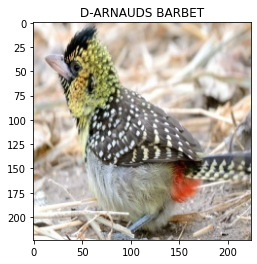

Predicted image


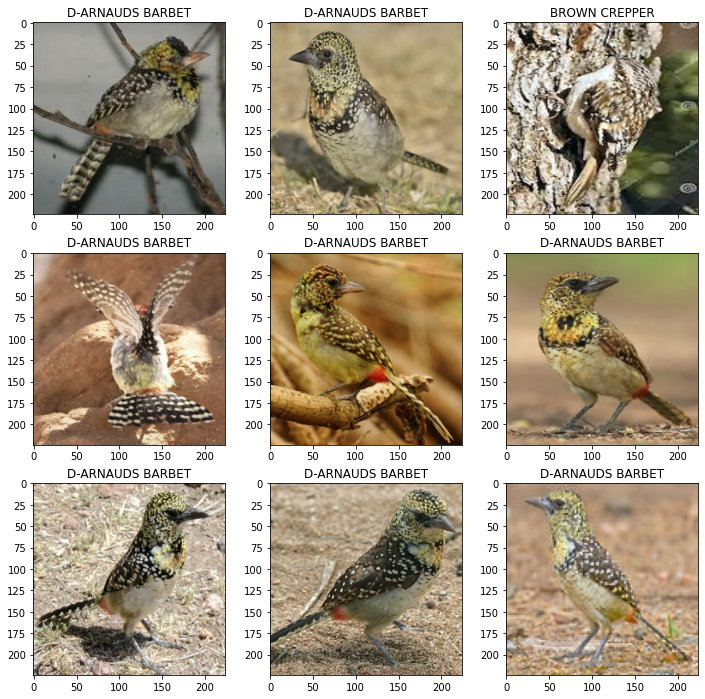

Final Result : D-ARNAUDS BARBET


In [ ]:
show_result_img(query[489], gallery_loader)
print('Final Result :', predict(query[489], gallery_loader))

In [ ]:
# testing 
def test(query_loader, gallery_loader, report = True, matrix = True ,dist_func='euclidean', k=10):
    ''' Test function for image retrieval method
        Args:
            query_loader : Loader of all query image
            gallery_loader : Loader of gallery
            report (bool) : Get classification report ?
            matrix (bool) : Get confusion matrix ?
            dist_func (string) : name of distance function
            k (int) : number of top k similar image to get predict
    '''
    correct = 0
    targets = []
    predictions = []
    for query in tqdm(query_loader.dataset):
        # for i in tqdm(range(len(batch_query['idx']))):
            # query = {'idx' : batch_query['idx'][i],
            #          'img_vector' : batch_query['img_vector'][i],
            #          'img_path'   : batch_query['img_path'][i],
            #          'label'      : batch_query['label'][i]}
        # get prediction and target
        prediction = predict(query, gallery_loader, dist_func, k)
        target = query['label']
        # comparation
        correct += int(prediction == target)
        # store result and target   
        predictions.append(prediction)
        targets.append(target)
    accuracy = correct / len(query_loader.dataset)
    print('********** TESTING RESULT ***********')
    print('Test accuracy: {:.6f} ({} / {})'.format(accuracy, correct, len(query_loader.dataset)))

    if report:
        print('******* CLASSIFICATION REPORT *******')
        print(classification_report(targets, predictions, target_names=CLASSES))
    if matrix:
        print('********* CONFUSION MATRIX **********')
        cm = confusion_matrix(targets, predictions)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                      display_labels=CLASSES)

        # NOTE: Fill all variables here with default values of the plot_confusion_matrix
        plt.style.use('default')
        fig, ax = plt.subplots(figsize=(200, 200))
        disp = disp.plot(xticks_rotation='vertical', ax=ax, cmap='inferno')
        # save the confusion matrix image
        print('Saving confusion matrix ... ', end='')
        cm_file = os.path.join(cm_path, 'Image Retrieval.png')
        plt.savefig(cm_file)
        print(f'Completed\nYour pictur have been saved as {cm_file}')
        plt.close()

In [ ]:
test(query_loader, gallery_loader, k=5)

  0%|          | 0/1575 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


********** TESTING RESULT ***********
Test accuracy: 0.945397 (1489 / 1575)
******* CLASSIFICATION REPORT *******
                             precision    recall  f1-score   support

      AFRICAN CROWNED CRANE       1.00      0.80      0.89         5
          AFRICAN FIREFINCH       0.83      1.00      0.91         5
                  ALBATROSS       0.71      1.00      0.83         5
       ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
            AMERICAN AVOCET       1.00      1.00      1.00         5
           AMERICAN BITTERN       0.83      1.00      0.91         5
              AMERICAN COOT       0.83      1.00      0.91         5
         AMERICAN GOLDFINCH       1.00      1.00      1.00         5
           AMERICAN KESTREL       1.00      1.00      1.00         5
             AMERICAN PIPIT       0.80      0.80      0.80         5
          AMERICAN REDSTART       1.00      0.80      0.89         5
                    ANHINGA       1.00      1.00      1.0

# Tensorboard

In [ ]:
tensorboard --logdir='/content/drive/MyDrive/ProjectI/Summary'

Reusing TensorBoard on port 6006 (pid 270), started 0:02:59 ago. (Use '!kill 270' to kill it.)

<IPython.core.display.Javascript object>